In [2]:
# multiple ouput
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# libraries
import pandas as pd
import numpy as np

# matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")
sns.set_context("notebook")
#sns.set_context("poster")

# For rescaling data
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

#label
from sklearn.preprocessing import LabelEncoder

# MM
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import Binarizer

# Clustering
from sklearn.metrics import accuracy_score
from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import InterclusterDistance
from yellowbrick.model_selection import LearningCurve
from sklearn import metrics

# METRIC PERFORMANCE
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Classification
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# Displaying a tree
from IPython.display import HTML
from sklearn import tree
from graphviz import Source
from IPython.display import SVG, display
from ipywidgets import interactive

# Ensemble
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

#XGBoost
import xgboost as xgb
from xgboost import XGBClassifier
from matplotlib.pylab import rcParams
import matplotlib.pylab as pl
from sklearn.model_selection import GridSearchCV

IMPORT

In [4]:
data = pd.read_csv("WA_Fn-UseC_-Telco-Customer-Churn.csv")
data.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


DESCRIPTION OF EACH COLUMN
- customerID Customer ID
- gender Whether the customer is a male or a female
- SeniorCitizen Whether the customer is a senior citizen or not (1, 0)
- Partner Whether the customer has a partner or not (Yes, No)
- Dependents Whether the customer has dependents or not (Yes, No)
- tenure Number of months the customer has stayed with the company
- PhoneService Whether the customer has a phone service or not (Yes, No)
- MultipleLines Whether the customer has multiple lines or not (Yes, No, No phone service)
- InternetService Customer’s internet service provider (DSL, Fiber optic, No)
- OnlineSecurity Whether the customer has online security or not (Yes, No, No internet service)
- OnlineBackup Whether the customer has online backup or not (Yes, No, No internet service)
- DeviceProtection Whether the customer has device protection or not (Yes, No, No internet service)
- TechSupport Whether the customer has tech support or not (Yes, No, No internet service)
- StreamingTV Whether the customer has streaming TV or not (Yes, No, No internet service)
- StreamingMovies Whether the customer has streaming movies or not (Yes, No, No internet service)
- Contract The contract term of the customer (Month-to-month, One year, Two year)
- PaperlessBilling Whether the customer has paperless billing or not (Yes, No)
- PaymentMethod The customer’s payment method (Electronic check, Mailed check, Bank transfer (automatic), Credit card (automatic))
- MonthlyCharges The amount charged to the customer monthly
- TotalCharges The total amount charged to the customer
- Churn Whether the customer churned or not (Yes or No)

In [3]:
#data.isnull().sum()

CLEAN DATA

In [4]:
#drop customerID, assign some similar data
data.drop(columns=["customerID"], inplace = True)
data["MultipleLines"].replace("No phone service", "No", inplace = True)
data.replace("No internet service", "No", inplace = True)

# label encoder
def object_to_int(dataframe_series):
    if dataframe_series.dtype=='object':
        dataframe_series = LabelEncoder().fit_transform(dataframe_series)
    return dataframe_series
data = data.apply(lambda x: object_to_int(x))

In [5]:
#drop customerID, assign some similar data
#data.drop(columns=["customerID"], inplace = True)
#data["MultipleLines"].replace("No phone service", "No", inplace = True)
#data.replace("No internet service", "No", inplace = True)

#for column in data.select_dtypes('object'):
#    if len(data[column].unique()) == 2:
#        data[column] = pd.get_dummies(data[column], dtype='int64')
#    else:
#        data = pd.get_dummies(data, prefix=column, columns=[column], drop_first=True, dtype='int64')

INSPECT DATA

In [6]:
#inspect data
data.head()
data.dtypes
data.isna().sum()
data.shape
data.columns

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,2,29.85,2505,0
1,1,0,0,0,34,1,0,0,1,0,1,0,0,0,1,0,3,56.95,1466,0
2,1,0,0,0,2,1,0,0,1,1,0,0,0,0,0,1,3,53.85,157,1
3,1,0,0,0,45,0,0,0,1,0,1,1,0,0,1,0,0,42.30,1400,0
4,0,0,0,0,2,1,0,1,0,0,0,0,0,0,0,1,2,70.70,925,1


gender                int64
SeniorCitizen         int64
Partner               int64
Dependents            int64
tenure                int64
PhoneService          int64
MultipleLines         int64
InternetService       int64
OnlineSecurity        int64
OnlineBackup          int64
DeviceProtection      int64
TechSupport           int64
StreamingTV           int64
StreamingMovies       int64
Contract              int64
PaperlessBilling      int64
PaymentMethod         int64
MonthlyCharges      float64
TotalCharges          int64
Churn                 int64
dtype: object

gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

(7043, 20)

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

In [7]:
# separate churn as an output y
y = data["Churn"]
X = data.drop("Churn", axis = 1)
X.head()
y.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,2,29.85,2505
1,1,0,0,0,34,1,0,0,1,0,1,0,0,0,1,0,3,56.95,1466
2,1,0,0,0,2,1,0,0,1,1,0,0,0,0,0,1,3,53.85,157
3,1,0,0,0,45,0,0,0,1,0,1,1,0,0,1,0,0,42.30,1400
4,0,0,0,0,2,1,0,1,0,0,0,0,0,0,0,1,2,70.70,925


0    0
1    0
2    1
3    0
4    1
Name: Churn, dtype: int64

In [8]:
# Scale between 0 and 1 to work with distance metrics such as kmeans
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled_fit = min_max_scaler.fit(X)
x_scaled = min_max_scaler.fit_transform(X)
X_scaled = pd.DataFrame(x_scaled,columns=X.columns)
X_scaled.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,0.0,0.0,1.0,0.0,0.013889,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.666667,0.115423,0.383614
1,1.0,0.0,0.0,0.0,0.472222,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.5,0.0,1.000000,0.385075,0.224502
2,1.0,0.0,0.0,0.0,0.027778,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.000000,0.354229,0.024043
3,1.0,0.0,0.0,0.0,0.625000,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.5,0.0,0.000000,0.239303,0.214395
4,0.0,0.0,0.0,0.0,0.027778,1.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.666667,0.521891,0.141654


MODEL EVALUATION

In [9]:
print("################")
print("Model evaluation")
print("################")

#### Train & Test Split #### 
test_size=0.2
X_train, X_test, y_train, y_test = train_test_split(x_scaled,y, test_size=test_size)
model = LogisticRegression(solver='liblinear', multi_class='auto')
model.fit(X_train,y_train)
result = model.score(X_test, y_test)
print(f'Accuracy {result*100:5.3f}')

#### K-Fold #### 
splits=10
kfold=KFold(n_splits=splits, random_state=10)
model = LogisticRegression(solver='liblinear', multi_class='auto')
results = cross_val_score(model, x_scaled, y, cv=kfold)
print(f'Logistic regression, k-fold {splits:d} - Accuracy {results.mean()*100:5.3f}% ({results.std()*100:5.3f}%)')
results

print("###########################################################################################")

################
Model evaluation
################


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

Accuracy 79.702
Logistic regression, k-fold 10 - Accuracy 80.378% (0.993%)


array([0.79574468, 0.80283688, 0.80283688, 0.82386364, 0.80113636,
       0.78409091, 0.81392045, 0.80113636, 0.80681818, 0.80539773])

###########################################################################################


METRIC PERFORMANCE

In [10]:
print("################")
print("Metric performance")
print("################")
print()

#Accuracy, Logloss, AUC
scores= ["accuracy", "neg_log_loss", "roc_auc"]
for scoring in scores:
    splits=10
    skfold=StratifiedKFold(n_splits=splits, random_state=7)
    model = LogisticRegression(solver='liblinear')
    results = cross_val_score(model, X, y, scoring=scoring, cv=skfold)
    print(scoring, f'Logistic regression, k-fold {splits:d} {results.mean():.3f} ({results.std():5.3f})')
    print()
    
#Confusion Matrix
test_size=0.3
seed=7

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)
model = LogisticRegression(solver='liblinear')
model.fit(X_train, y_train)
y_predicted = model.predict(X_test)
c_matrix=confusion_matrix(y_test, y_predicted)
print("Confusion Matrix")
print(c_matrix)
print()
print(f'Accuracy {model.score(X_test, y_test)*100:.5f}')
print(f'Accuracy check with conf. matrix {(c_matrix[0,0]+c_matrix[1,1])/c_matrix.sum()*100:.5f}')

#Classification Report
test_size=0.3
seed=7
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)
model = LogisticRegression(solver='liblinear')
model.fit(X_train, y_train)
y_predicted = model.predict(X_test)
report = classification_report(y_test, y_predicted, digits=5)


print(f'Accuracy {model.score(X_test, y_test)*100:.5f}')
print()
print(report)

print("###########################################################################################")

################
Metric performance
################

accuracy Logistic regression, k-fold 10 0.803 (0.012)

neg_log_loss Logistic regression, k-fold 10 -0.420 (0.017)

roc_auc Logistic regression, k-fold 10 0.842 (0.015)



LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

Confusion Matrix
[[1386  139]
 [ 277  311]]

Accuracy 80.31235
Accuracy check with conf. matrix 80.31235


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

Accuracy 80.31235

              precision    recall  f1-score   support

           0    0.83343   0.90885   0.86951      1525
           1    0.69111   0.52891   0.59923       588

    accuracy                        0.80312      2113
   macro avg    0.76227   0.71888   0.73437      2113
weighted avg    0.79383   0.80312   0.79430      2113

###########################################################################################


-------------------------------------------------
METRIC PERFORMANCE: Result analysis & strategic recommendation
-------------------------------------------------

Accuracy is the ratio of correct predictions over all predictions. It is by far the most used metrics
    - We have obtain a strong result of more than 80% that cannot be significantly improved since the model has 
    noise
    
Area under the ROC curve (AUC for short) is a metric used in binary classifications.
    - We have obtained a strong result of more than 84%.
    
The confusion matrix is a presentation of the accuracy of the model in its four classes: True Positives, False Positives, False Negatives and True Negatives. From it we can easily derive Precision, Recall, Specificity and Accuracy.
    - We have obtained a strong result of accuracy higher than 80%
    
Classification report: The scikit-learn library provides a report that is convenient and useful in terms of summarizing many of the measures that are commonly used together with accuracy. 
    - Precision is the ability of a classiifer not to label an instance positive that is actually negative
        - WEIGHTED AVERAGE: 0.79383 STRONG
    - Recall is the ability of a classifier to find all positive instances
        - WEIGHTED AVERAGE: 0.80312 STRONG
    - The F1 score is a weighted mean of precision and recall such that the best score is 1.0 and the worst is 0.0.
        -  WEIGHTED AVERAGE: 0.79430 STRONG
    

CLASSIFICATION

################
Classification
################


Logistic Regression - Accuracy 80.307% std 1.017767
Logistic Regression (-1..1) - Accuracy 80.406% std 0.928048
Logistic Regression ( 0..1) - Accuracy 80.378% std 0.992981


LDA Linear Discriminant Analysis - Accuracy 80.236% std 1.046768
LDA (-1..1) - Accuracy 80.236% std 1.046768
LDA ( 0..1) - Accuracy 80.236% std 1.046768


KNN - Accuracy 75.238% std 1.045557
KNN (-1..1) - Accuracy 75.663% std 0.910951
KNN ( 0..1) - Accuracy 74.911% std 0.934882


Naive Bayes - Accuracy 75.919% std 1.150503
Naive Bayes (-1..1) - Accuracy 75.962% std 1.237709
Naive Bayes ( 0..1) - Accuracy 75.962% std 1.237709


Decision Tree - Accuracy 74.116% std 1.322235
Decision Tree (-1..1) - Accuracy 74.088% std 1.317052
Decision Tree ( 0..1) - Accuracy 74.145% std 1.407261


Support Vector Machines - Accuracy 73.463% std 1.171096
SVM (-1..1) - Accuracy 79.710% std 0.864407
SVM ( 0..1) - Accuracy 79.767% std 0.933039



<Figure size 1080x648 with 0 Axes>

###########################################################################################


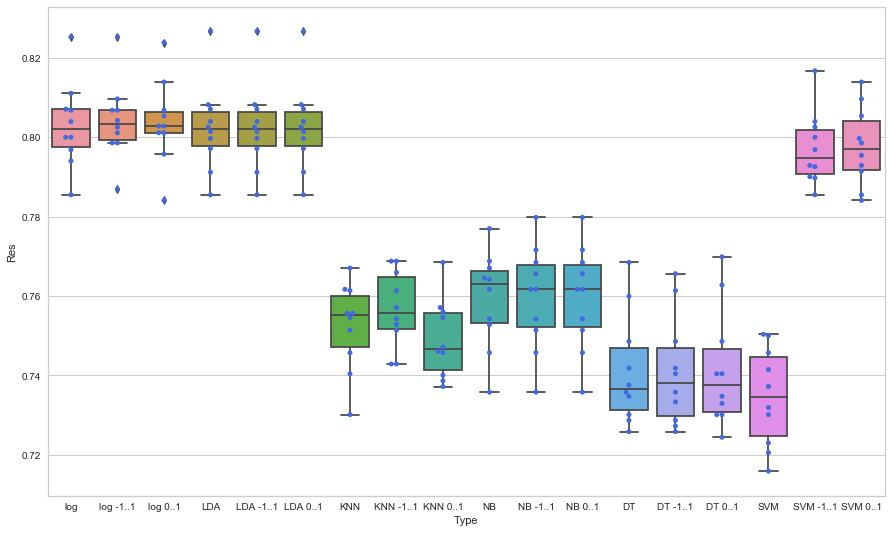

In [11]:
print("################")
print("Classification")
print("################")
print()

# Create the DataFrames for plotting
resall=pd.DataFrame()
res_w1=pd.DataFrame()
res_w2=pd.DataFrame()
res_w3=pd.DataFrame()

#Now we standarize our data 
std_scaler=preprocessing.StandardScaler()
X_std=std_scaler.fit_transform(X)
minmax_scaler=preprocessing.MinMaxScaler()
X_minmax=minmax_scaler.fit_transform(X)

# Logistic Regression
from sklearn.linear_model import LogisticRegression
kfold=KFold(n_splits=10, random_state=7)
model=LogisticRegression(solver="liblinear")
results=cross_val_score(model, X, y, cv=kfold)
print()
print(f'Logistic Regression - Accuracy {results.mean()*100:.3f}% std {results.std()*100:3f}')
results_scl=cross_val_score(model, X_std, y, cv=kfold)
print(f'Logistic Regression (-1..1) - Accuracy {results_scl.mean()*100:.3f}% std {results_scl.std()*100:3f}')
results_minmax=cross_val_score(model, X_minmax, y, cv=kfold)
print(f'Logistic Regression ( 0..1) - Accuracy {results_minmax.mean()*100:.3f}% std {results_minmax.std()*100:3f}')
print()

res_w1["Res"]=results
res_w1["Type"]="log"

res_w2["Res"]=results_scl
res_w2["Type"]="log -1..1"

res_w3["Res"]=results_minmax
res_w3["Type"]="log 0..1"

resall=pd.concat([resall,res_w1,res_w2,res_w3], ignore_index=True)

# LDA - Linear Discriminant Analysis 
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
kfold=KFold(n_splits=10, random_state=7)
model=LinearDiscriminantAnalysis()
results=cross_val_score(model, X, y, cv=kfold)
print()
print(f'LDA Linear Discriminant Analysis - Accuracy {results.mean()*100:.3f}% std {results.std()*100:3f}')
results_scl=cross_val_score(model, X_std, y, cv=kfold)
print(f'LDA (-1..1) - Accuracy {results_scl.mean()*100:.3f}% std {results_scl.std()*100:3f}')
results_minmax=cross_val_score(model, X_minmax, y, cv=kfold)
print(f'LDA ( 0..1) - Accuracy {results_minmax.mean()*100:.3f}% std {results_minmax.std()*100:3f}')
print()
res_w1["Res"]=results
res_w1["Type"]="LDA"
res_w2["Res"]=results_scl
res_w2["Type"]="LDA -1..1"
res_w3["Res"]=results_minmax
res_w3["Type"]="LDA 0..1"
resall=pd.concat([resall,res_w1,res_w2,res_w3], ignore_index=True)

# KNN Classification
from sklearn.neighbors import KNeighborsClassifier
kfold=KFold(n_splits=10, random_state=7)
model=KNeighborsClassifier()
results=cross_val_score(model, X, y, cv=kfold)
print()
print(f'KNN - Accuracy {results.mean()*100:.3f}% std {results.std()*100:3f}')
results_scl=cross_val_score(model, X_std, y, cv=kfold)
print(f'KNN (-1..1) - Accuracy {results_scl.mean()*100:.3f}% std {results_scl.std()*100:3f}')
results_minmax=cross_val_score(model, X_minmax, y, cv=kfold)
print(f'KNN ( 0..1) - Accuracy {results_minmax.mean()*100:.3f}% std {results_minmax.std()*100:3f}')
print()
res_w1["Res"]=results
res_w1["Type"]="KNN"
res_w2["Res"]=results_scl
res_w2["Type"]="KNN -1..1"
res_w3["Res"]=results_minmax
res_w3["Type"]="KNN 0..1"
resall=pd.concat([resall,res_w1,res_w2,res_w3], ignore_index=True)

# Naive Bayes
from sklearn.naive_bayes import GaussianNB
kfold=KFold(n_splits=10, random_state=7)
model=GaussianNB()
results=cross_val_score(model, X, y, cv=kfold)
print()
print(f'Naive Bayes - Accuracy {results.mean()*100:.3f}% std {results.std()*100:3f}')
results_scl=cross_val_score(model, X_std, y, cv=kfold)
print(f'Naive Bayes (-1..1) - Accuracy {results_scl.mean()*100:.3f}% std {results_scl.std()*100:3f}')
results_minmax=cross_val_score(model, X_minmax, y, cv=kfold)
print(f'Naive Bayes ( 0..1) - Accuracy {results_minmax.mean()*100:.3f}% std {results_minmax.std()*100:3f}')
print()
res_w1["Res"]=results
res_w1["Type"]="NB"
res_w2["Res"]=results_scl
res_w2["Type"]="NB -1..1"
res_w3["Res"]=results_minmax
res_w3["Type"]="NB 0..1"
resall=pd.concat([resall,res_w1,res_w2,res_w3], ignore_index=True)

# Decision Trees
from sklearn.tree import DecisionTreeClassifier
seed=7
kfold=KFold(n_splits=10, random_state=seed)
model=DecisionTreeClassifier(class_weight="balanced", random_state=seed)
results=cross_val_score(model, X, y, cv=kfold)
print()
print(f'Decision Tree - Accuracy {results.mean()*100:.3f}% std {results.std()*100:3f}')
results_scl=cross_val_score(model, X_std, y, cv=kfold)
print(f'Decision Tree (-1..1) - Accuracy {results_scl.mean()*100:.3f}% std {results_scl.std()*100:3f}')
results_minmax=cross_val_score(model, X_minmax, y, cv=kfold)
print(f'Decision Tree ( 0..1) - Accuracy {results_minmax.mean()*100:.3f}% std {results_minmax.std()*100:3f}')
print()
res_w1["Res"]=results
res_w1["Type"]="DT"
res_w2["Res"]=results_scl
res_w2["Type"]="DT -1..1"
res_w3["Res"]=results_minmax
res_w3["Type"]="DT 0..1"
resall=pd.concat([resall,res_w1,res_w2,res_w3], ignore_index=True)

# SVM - Support Vector Machines
from sklearn.svm import SVC
kfold=KFold(n_splits=10, random_state=7)
model=SVC(gamma="scale")
results=cross_val_score(model, X, y, cv=kfold)
print()
print(f'Support Vector Machines - Accuracy {results.mean()*100:.3f}% std {results.std()*100:3f}')
results_scl=cross_val_score(model, X_std, y, cv=kfold)
print(f'SVM (-1..1) - Accuracy {results_scl.mean()*100:.3f}% std {results_scl.std()*100:3f}')
results_minmax=cross_val_score(model, X_minmax, y, cv=kfold)
print(f'SVM ( 0..1) - Accuracy {results_minmax.mean()*100:.3f}% std {results_minmax.std()*100:3f}')
print()
res_w1["Res"]=results
res_w1["Type"]="SVM"
res_w2["Res"]=results_scl
res_w2["Type"]="SVM -1..1"
res_w3["Res"]=results_minmax
res_w3["Type"]="SVM 0..1"
resall=pd.concat([resall,res_w1,res_w2,res_w3], ignore_index=True)

# Now let's compare them all 
plt.figure(figsize=(15,9))
sns.boxplot(data=resall, x="Type", y="Res")
sns.swarmplot(data=resall, x="Type", y="Res", color="royalblue")

print("###########################################################################################")


In [12]:
# Display a tree

style = "<style>svg{width:70% !important;height:70% !important;}</style>"
HTML(style)

model=DecisionTreeClassifier(class_weight="balanced", random_state=seed)
model.fit(X,y)

graph=Source(tree.export_graphviz(model,
        out_file=None,      
        feature_names=data.columns[0:-1],
        class_names=['NO churn','CHURN'],
        filled=True,
        rounded=True))

display(SVG(graph.pipe(format="svg")))

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=7, splitter='best')

-------------------------------------------------
CLASSIFICATION: Result analysis & strategic recommendation
-------------------------------------------------
We will address the question: <i>What algorithms should I use in this dataset?</i>

With the following result, We observe that Logisitic Regression yield the **higher accuracy**:
        - Logistic Regression - Accuracy 80.307% std 1.017767
        - Logistic Regression (-1..1) - Accuracy 80.406% std 0.928048
        - Logistic Regression ( 0..1) - Accuracy 80.378% std 0.992981


We should go for this **2nd algorithm** as the **result is the highest** and the **standard deviation is very low**, so we would have consistent results. When we observe the graph, we observe that there are **fewer outliers** than the other regression methods.
        - Logistic Regression - Accuracy 80.307% std 1.017767
     -->- Logistic Regression (-1..1) - Accuracy 80.406% std 0.928048
        - Logistic Regression ( 0..1) - Accuracy 80.378% std 0.992981
    


ENSEMBLE


Bagged Decision Trees - Accuracy 78.730% std 1.439205


Random Forest - Accuracy 79.497% std 1.358982


Extra Trees - Accuracy 78.120% std 1.561578


AdaBoost - Accuracy 79.852% std 1.316341


Stochastic Gradient Boosting - Accuracy 79.696% std 1.438133


Voting Ensemble (log,cart,rfc) - Accuracy 79.753% std 1.372201



<Figure size 1080x648 with 0 Axes>

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features=3, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=7, verbose=0,
                       warm_start=False)

gender           0.0269
SeniorCitizen    0.0204
Partner          0.0223
Dependents       0.0199
tenure           0.1862
PhoneService     0.0075
MultipleLines    0.0198
InternetService  0.0443
OnlineSecurity   0.0257
OnlineBackup     0.0222
DeviceProtection  0.0190
TechSupport      0.0246
StreamingTV      0.0174
StreamingMovies  0.0188
Contract         0.0880
PaperlessBilling  0.0274
PaymentMethod    0.0565
MonthlyCharges   0.1851
TotalCharges     0.1679


<Figure size 1080x648 with 0 Axes>

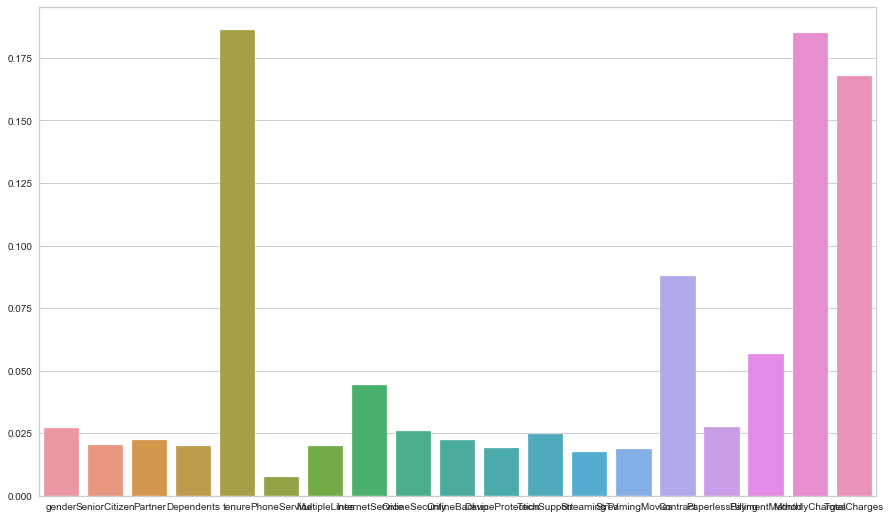

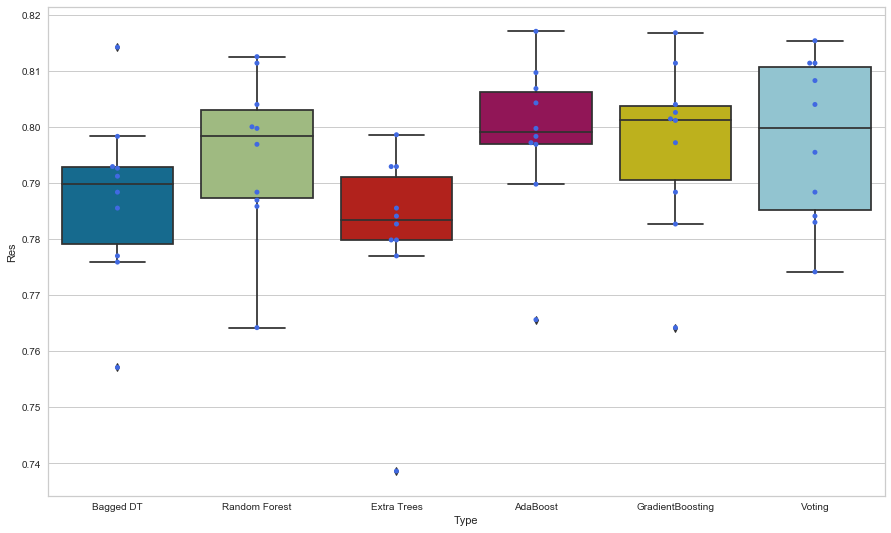

In [13]:
# Create the DataFrames for plotting
resall=pd.DataFrame()
res_w1=pd.DataFrame()
res_w2=pd.DataFrame()
res_w3=pd.DataFrame()

# Bagged Decision Trees
seed=7
kfold=KFold(n_splits=10, random_state=seed)
learner=DecisionTreeClassifier(random_state=seed)
num_trees=100
model=BaggingClassifier(base_estimator=learner, n_estimators=num_trees, random_state=seed)
results=cross_val_score(model, X, y, cv=kfold)
print()
print(f'Bagged Decision Trees - Accuracy {results.mean()*100:.3f}% std {results.std()*100:3f}')
print()
res_w1["Res"]=results
res_w1["Type"]="Bagged DT"
resall=pd.concat([resall,res_w1], ignore_index=True)

# Random Forest
seed=7
kfold=KFold(n_splits=10, random_state=seed)
num_trees=100
num_features=3
model=RandomForestClassifier(n_estimators=num_trees, max_features=num_features, random_state=seed)
results=cross_val_score(model, X, y, cv=kfold)
print()
print(f'Random Forest - Accuracy {results.mean()*100:.3f}% std {results.std()*100:3f}')
print()
res_w1["Res"]=results
res_w1["Type"]="Random Forest"
resall=pd.concat([resall,res_w1], ignore_index=True)

# Extra Trees
seed=7
kfold=KFold(n_splits=10, random_state=seed)
num_trees=300
num_features=5
model=ExtraTreesClassifier(n_estimators=num_trees, max_features=num_features, random_state=seed)
results=cross_val_score(model, X, y, cv=kfold)
print()
print(f'Extra Trees - Accuracy {results.mean()*100:.3f}% std {results.std()*100:3f}')
print()
res_w1["Res"]=results
res_w1["Type"]="Extra Trees"
resall=pd.concat([resall,res_w1], ignore_index=True)

# AdaBoost
seed=7
kfold=KFold(n_splits=10, random_state=seed)
num_trees=30
model=AdaBoostClassifier(n_estimators=num_trees, random_state=seed)
results=cross_val_score(model, X, y, cv=kfold)
print()
print(f'AdaBoost - Accuracy {results.mean()*100:.3f}% std {results.std()*100:3f}')
print()
res_w1["Res"]=results
res_w1["Type"]="AdaBoost"
resall=pd.concat([resall,res_w1], ignore_index=True)

# Stochastic Gradient Boosting
seed=7
kfold=KFold(n_splits=10, random_state=seed)
num_trees=30
model=GradientBoostingClassifier(n_estimators=num_trees, random_state=seed)
results=cross_val_score(model, X, y, cv=kfold)
print()
print(f'Stochastic Gradient Boosting - Accuracy {results.mean()*100:.3f}% std {results.std()*100:3f}')
print()
res_w1["Res"]=results
res_w1["Type"]="GradientBoosting"
resall=pd.concat([resall,res_w1], ignore_index=True)

# Voting Ensemble
seed=7
kfold=KFold(n_splits=10, random_state=seed)
estimators=[]
model1=LogisticRegression(solver="liblinear")
estimators.append(("logistic", model1)) #logistic regression
model2=DecisionTreeClassifier(random_state=seed)
estimators.append(("cart", model2)) #decision tree
num_trees=100
num_features=3
model4=RandomForestClassifier(n_estimators=num_trees, max_features=num_features, random_state=seed)
estimators.append(("rfc", model4)) 
model=VotingClassifier(estimators)
results=cross_val_score(model, X, y, cv=kfold)
print()
print(f'Voting Ensemble (log,cart,rfc) - Accuracy {results.mean()*100:.3f}% std {results.std()*100:3f}')
print()
res_w1["Res"]=results
res_w1["Type"]="Voting"
resall=pd.concat([resall,res_w1], ignore_index=True)

# Random Forest
plt.figure(figsize=(15,9))
seed=7
num_trees=100
num_features=3
model=RandomForestClassifier(n_estimators=num_trees, max_features=num_features, random_state=seed)
model.fit(X,y)
for name, importance in zip(data.columns[:-1], model.feature_importances_):
    print(f'{name:15s}  {importance:.4f}')
sns.barplot(x=data.columns[:-1], y=model.feature_importances_)

# Now let's compare them all 
plt.figure(figsize=(15,9))
sns.boxplot(data=resall, x="Type", y="Res")
sns.swarmplot(data=resall, x="Type", y="Res", color="royalblue")

In [13]:
# Visualising the tree
seed=7

num_trees=100
num_features=3

model=RandomForestClassifier(n_estimators=num_trees, max_features=num_features, random_state=seed)
model.fit(X,y)

estimator = model.estimators_[5]


graph=Source(tree.export_graphviz(estimator,
        out_file=None,
        feature_names=data.columns[:-1],
        class_names=['Churn','No Churn'],
        filled=True,
        rounded=True))
graph

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features=3, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=7, verbose=0,
                       warm_start=False)

-------------------------------------------------
ENSEMBLE: Result analysis & strategic recommendation
-------------------------------------------------


FEATURE IMPORTANCE: The most important features that explain whether people are churning are these features (in order of importance):
    1. Tenure           0.1862
    2. MonthlyCharges   0.1851
    3. TotalCharges     0.1679
    4. Contract         0.0880
    5. PaymentMethod    0.0565

**Recommendation to reduce churn rate:**
- They should increase Tenure by **increasing the loyaly in the first months** of their customers. If they stay for a long time they are less likely to leave, as churning people are the ones that leave very early.
- They should **decrease Monthly Charges**. The people that leave are the ones that pay too much per month. It is bad for business as, as we are going to see in the clustering section, a high monthly charge does not necessarily leads to a high Total charge over the years, as people may leave in the process.
- As we will observe in the clustering section, the longer the contracts, the more likely people are going to stay in the company without churning. Therefore, **yearly contracts are better** than monthly contracts.


Adaptive Boositing is the best machine learning meta-algorithm as the **accuracy** is the strongest and the **standard deviation is the lowest**.
    - AdaBoost - Accuracy 79.852% std 1.316341


XGBoost

Grid Best Score -0.4176747 N. of estimators  50

N. estimators  10 mean logloss -0.4911730 (0.00292)
N. estimators  25 mean logloss -0.4332929 (0.00510)
N. estimators  50 mean logloss -0.4176747 (0.00717)
N. estimators 100 mean logloss -0.4179852 (0.00837)
N. estimators 150 mean logloss -0.4199395 (0.00810)
N. estimators 200 mean logloss -0.4228028 (0.00844)
N. estimators 250 mean logloss -0.4259682 (0.00844)
N. estimators 300 mean logloss -0.4293722 (0.00876)


<Figure size 1080x648 with 0 Axes>

Text(0.5, 1.0, 'N. estimators & Logloss')

Text(0.5, 0, 'N. estimators')

Text(0, 0.5, 'Logloss')

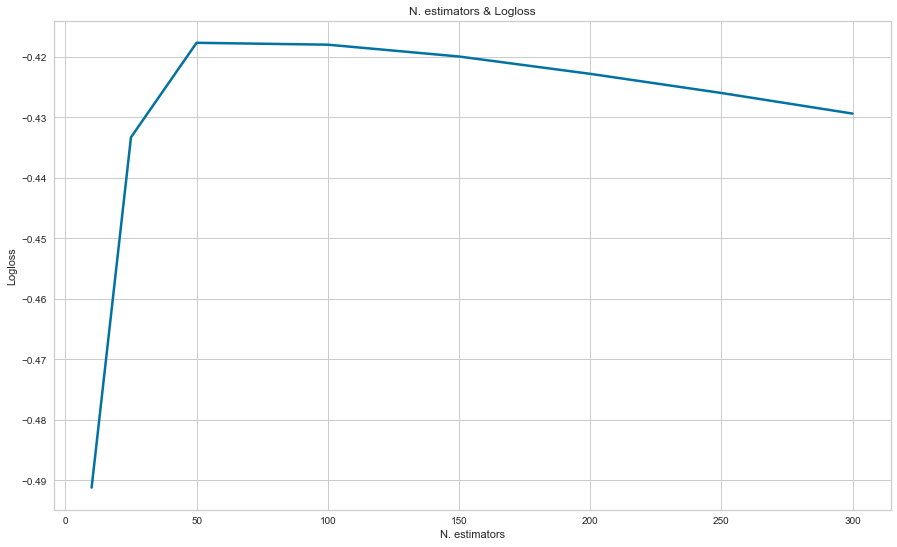

In [14]:
# XGBoost - Grid Search Parameter Tuning
#    

from sklearn.model_selection import GridSearchCV

seed=7

model = XGBClassifier()

kfold=StratifiedKFold(n_splits=3, random_state=seed)

param_grid={"n_estimators":[10, 25, 50, 100, 150, 200, 250, 300]}

grid=GridSearchCV(estimator=model, param_grid=param_grid, scoring="neg_log_loss", cv=kfold)
grid_result=grid.fit(X,y)

print(f'Grid Best Score {grid_result.best_score_:.7f} N. of estimators {grid_result.best_params_["n_estimators"]:3d}')
print()
      
means = grid_result.cv_results_["mean_test_score"]
stds = grid_result.cv_results_["std_test_score"]      
params = grid_result.cv_results_["params"] 
      
for mean,std,param in zip(means,stds,params):
      print(f'N. estimators {param["n_estimators"]:3d} mean logloss {mean:.7f} ({std:.5f})')

plt.figure(figsize=(15,9))
sns.lineplot(x=param_grid["n_estimators"], y=means, linewidth=2.5)
plt.title("N. estimators & Logloss")
plt.xlabel("N. estimators")
plt.ylabel("Logloss")



Grid Best Score 0.8040608 Max Depth of Decision Trees   2

N. estimators   1 depth of Decision Tree 0.7971035 (0.00413)
N. estimators   2 depth of Decision Tree 0.8040608 (0.00464)
N. estimators   3 depth of Decision Tree 0.8022150 (0.00091)
N. estimators   4 depth of Decision Tree 0.7978134 (0.00325)
N. estimators   5 depth of Decision Tree 0.7998012 (0.00340)
N. estimators   6 depth of Decision Tree 0.7945478 (0.00142)
N. estimators   7 depth of Decision Tree 0.7932699 (0.00368)
N. estimators   8 depth of Decision Tree 0.7925600 (0.00331)
N. estimators   9 depth of Decision Tree 0.7844668 (0.00340)
N. estimators  10 depth of Decision Tree 0.7843249 (0.00428)


<Figure size 1080x648 with 0 Axes>

Text(0.5, 1.0, 'Depth of the Decision Trees & Accuracy')

Text(0.5, 0, 'Depth of the Decision Trees')

Text(0, 0.5, 'Accuracy')

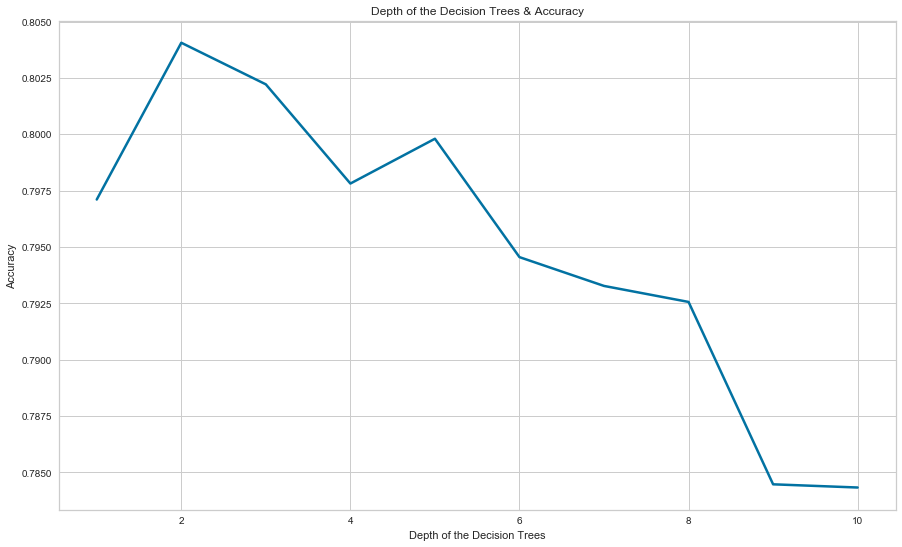

In [16]:
# XGBoost - Grid Search Parameter Tuning
#    

from sklearn.model_selection import GridSearchCV

seed=7

model = XGBClassifier()

kfold=StratifiedKFold(n_splits=3, random_state=seed)

param_grid={"max_depth":[1,2,3,4,5,6,7,8,9,10]}

grid=GridSearchCV(estimator=model, param_grid=param_grid, scoring="accuracy", cv=kfold)
grid_result=grid.fit(X,y)

print(f'Grid Best Score {grid_result.best_score_:.7f} Max Depth of Decision Trees {grid_result.best_params_["max_depth"]:3d}')
print()
      
means = grid_result.cv_results_["mean_test_score"]
stds = grid_result.cv_results_["std_test_score"]      
params = grid_result.cv_results_["params"] 
      
for mean,std,param in zip(means,stds,params):
      print(f'N. estimators {param["max_depth"]:3d} depth of Decision Tree {mean:.7f} ({std:.5f})')

plt.figure(figsize=(15,9))            
sns.lineplot(x=param_grid["max_depth"], y=means, linewidth=2.5)
plt.title("Depth of the Decision Trees & Accuracy")
plt.xlabel("Depth of the Decision Trees")
plt.ylabel("Accuracy")


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=2,
              min_child_weight=1, missing=None, n_estimators=150, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

XGBoost - Accuracy 80.234%
XGBoost with kfold - Accuracy 80.505% std 0.503500
XGBoost with Stratifiedkfold - Accuracy 80.463% std 0.260237


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

<Figure size 2160x1296 with 0 Axes>

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

gender           0.0166
SeniorCitizen    0.0322
Partner          0.0000
Dependents       0.0212
tenure           0.0658
PhoneService     0.0231
MultipleLines    0.0167
InternetService  0.0751
OnlineSecurity   0.0441
OnlineBackup     0.0175
DeviceProtection  0.0115
TechSupport      0.0398
StreamingTV      0.0491
StreamingMovies  0.0427
Contract         0.3996
PaperlessBilling  0.0617
PaymentMethod    0.0264
MonthlyCharges   0.0384
TotalCharges     0.0185


[0]	test-logloss:0.58021
Will train until test-logloss hasn't improved in 20 rounds.


//anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[100]	test-logloss:0.452405
[200]	test-logloss:0.426589
[300]	test-logloss:0.421903
Stopping. Best iteration:
[314]	test-logloss:0.421512



Text(0.5, 1.0, 'xgboost.plot_importance(model)')

Weight. The number of times a feature is used to split the data across all trees.


Text(0.5, 1.0, "xgboost.plot_importance(model, importance_type='cover')")

Text(0.5, 1.0, "xgboost.plot_importance(model, importance_type='gain')")

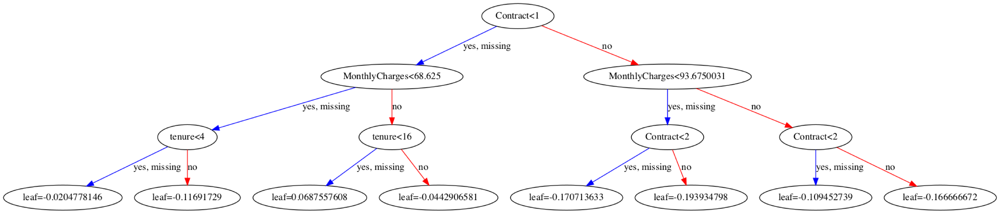

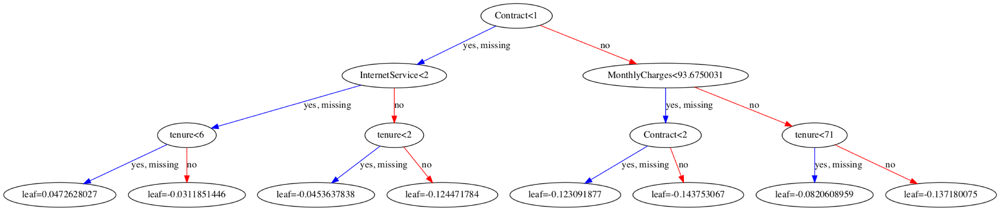

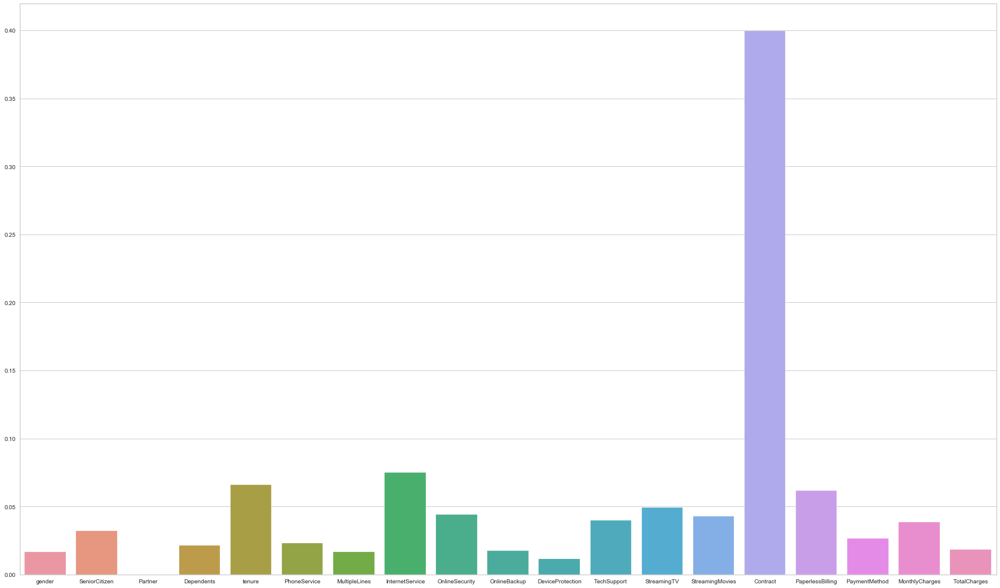

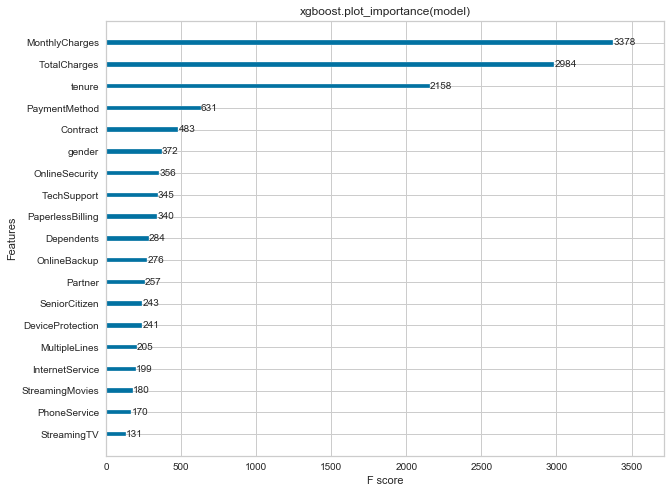

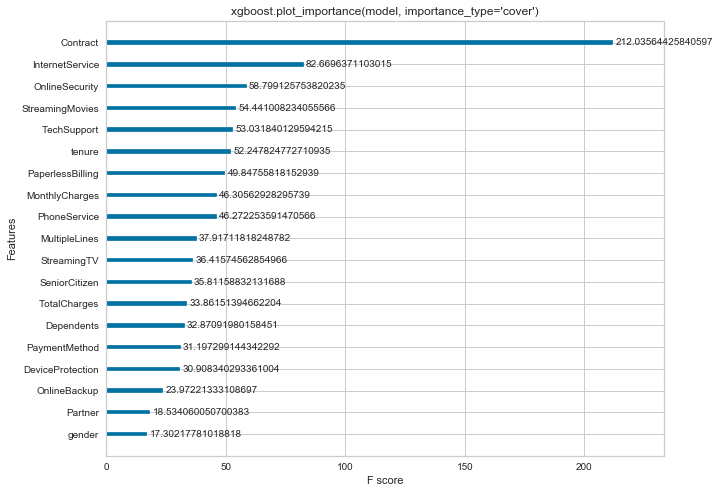

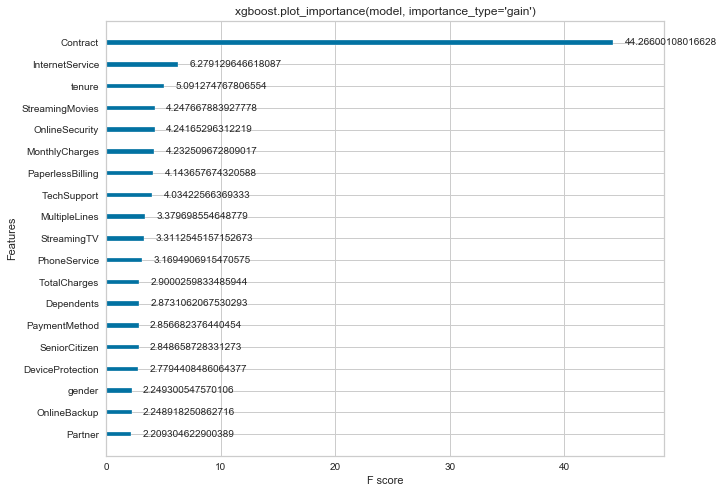

In [18]:
# XGBoost - train and test

seed=7
test_size=0.4
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)
model=xgb.XGBClassifier(max_depth=2,n_estimators=150)
model.fit(X_train, y_train)
y_predict=model.predict(X_test)
accuracy = accuracy_score(y_test, y_predict)
print(f'XGBoost - Accuracy {accuracy*100:.3f}%')

#XGBoost - Kfold
seed=7
kfold=KFold(n_splits=3, random_state=seed)
learner=xgb.XGBClassifier()
results=cross_val_score(model, X, y, cv=kfold)
print(f'XGBoost with kfold - Accuracy {results.mean()*100:.3f}% std {results.std()*100:3f}')

#XGBoost - Stratified Kfold
seed=7
kfold=StratifiedKFold(n_splits=3, random_state=seed)
learner=xgb.XGBClassifier()
results=cross_val_score(model, X, y, cv=kfold)
print(f'XGBoost with Stratifiedkfold - Accuracy {results.mean()*100:.3f}% std {results.std()*100:3f}')


#Plot a single XGBoost Decision Tree
rcParams['figure.figsize'] = 150,150
model=XGBClassifier()
model.fit(X,y)
xgb.plot_tree(model)
xgb.plot_tree(model, num_trees=4)

# XGBoost - Feature importance
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=7)
plt.figure(figsize=(30,18))
seed=7
model=XGBClassifier()
model.fit(X_train,y_train)
for name, importance in zip(data.columns, model.feature_importances_):
    print(f'{name:15s}  {importance:.4f}')
sns.barplot(x=data.columns[:-1], y=model.feature_importances_)

#Weigth-Cover-Gain
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=7)
d_train = xgb.DMatrix(X_train, label=y_train)
d_test = xgb.DMatrix(X_test, label=y_test)
params = {
    "eta": 0.01,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(y_train),
    "eval_metric": "logloss"
}
model = xgb.train(params, d_train, 5000, evals = [(d_test, "test")], verbose_eval=100, early_stopping_rounds=20)
# Weight. The number of times a feature is used to split the data across all trees.
ax=xgb.plot_importance(model, importance_type="weight")
pl.title("xgboost.plot_importance(model)")
print(f'Weight. The number of times a feature is used to split the data across all trees.')
ax.figure.set_size_inches(10,8)
# Cover. The number of times a feature is used to split the data across all trees 
#        weighted by the number of training data points that go through those splits.
ax=xgb.plot_importance(model, importance_type="cover")
pl.title("xgboost.plot_importance(model, importance_type='cover')")
ax.figure.set_size_inches(10,8)
# Gain. The average training loss reduction gained when using a feature for splitting.
ax=xgb.plot_importance(model, importance_type="gain")
pl.title("xgboost.plot_importance(model, importance_type='gain')")
ax.figure.set_size_inches(10,8)

-------------------------------------------------
XGBoost: Result analysis & strategic recommendation
-------------------------------------------------


FEATURE IMPORTANCE: The most important features that explain whether people are churning are these features (in order of importance):
    1. Contract         0.3996


**Recommendation to reduce churn rate:**

- When we observe the feature importance using XGBoost, we realise that the **contract** is the most important feature by far. **yearly contracts are better** than monthly contracts. So the company should **remove the monthly contracts** as it incentivise people to leave the company. 

XGBoost with Stratifiedkfold - Accuracy 80.221% std 0.091193 is the best as the **accuracy** is the strongest and the **standard deviation is the lowest**.

CLUSTERING

################
Clustering
################



<Figure size 864x648 with 0 Axes>

KElbowVisualizer(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x1c2898ec50>,
                 k=None, locate_elbow=True, metric='distortion', model=None,
                 timings=True)

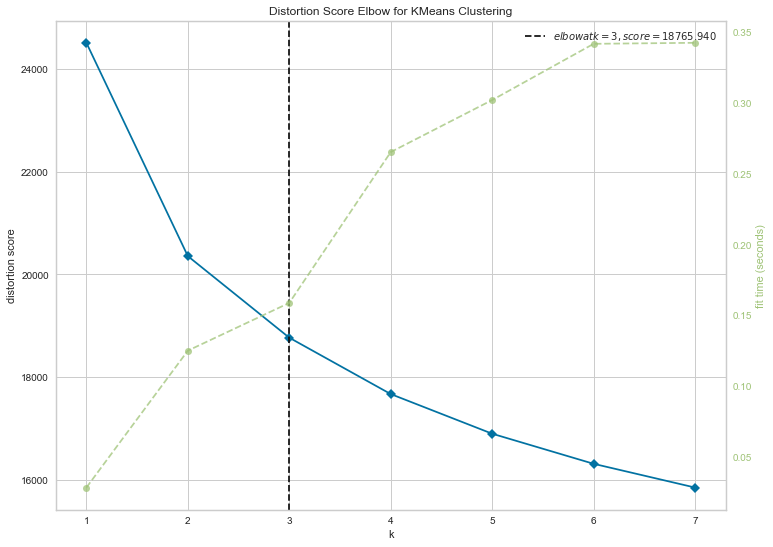

The Elbow method recommends us to use 3 clusters


<Figure size 864x648 with 0 Axes>

SilhouetteVisualizer(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x1c1fb9e780>,
                     colors='yellowbrick', is_fitted='auto', model=None)

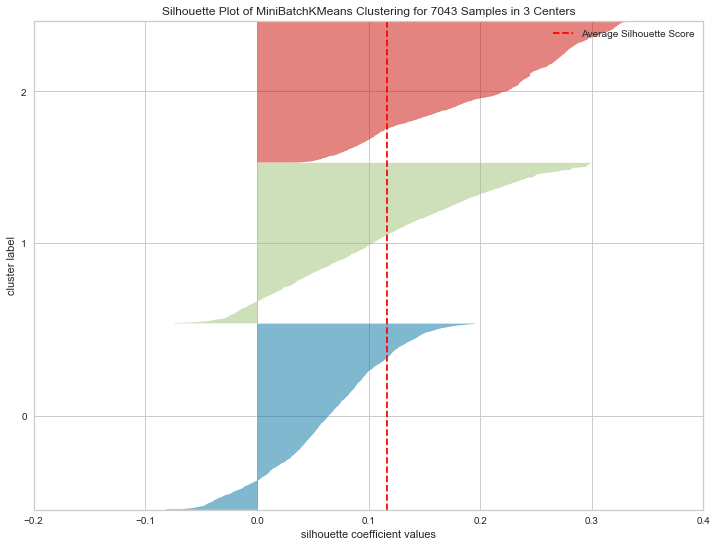

<Figure size 864x648 with 0 Axes>

InterclusterDistance(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x1c28a0cba8>,
                     embedding='mds', is_fitted='auto', legend=True,
                     legend_loc='lower left', legend_size=1.5, max_size=25000,
                     min_size=10000, model=None, random_state=None,
                     scoring='membership')

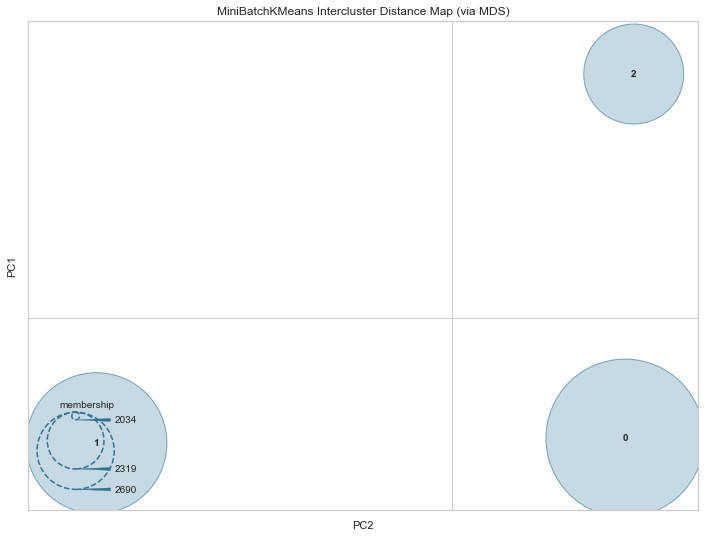

MiniBatchKMeans(batch_size=100, compute_labels=True, init='k-means++',
                init_size=None, max_iter=100, max_no_improvement=10,
                n_clusters=3, n_init=3, random_state=None,
                reassignment_ratio=0.01, tol=0.0, verbose=0)

Silhouette score 0.125165


array([2, 2, 2, ..., 2, 1, 0], dtype=int32)

array([[0.58808933, 0.12406948, 0.79900744, 0.49131514, 0.75379101,
        0.89330025, 0.66997519, 0.24441687, 0.66004963, 0.75186104,
        0.71215881, 0.64764268, 0.69727047, 0.64516129, 0.6426799 ,
        0.61538462, 0.38875103, 0.66934311, 0.60980776],
       [0.37923251, 0.36568849, 0.3227991 , 0.09706546, 0.36484199,
        0.94356659, 0.55756208, 0.38261851, 0.18058691, 0.35891648,
        0.38148984, 0.23476298, 0.64785553, 0.6523702 , 0.12302483,
        0.88487585, 0.54100828, 0.65973518, 0.47788294],
       [0.49541284, 0.06422018, 0.4204893 , 0.34556575, 0.33426775,
        0.8883792 , 0.20030581, 0.58256881, 0.1559633 , 0.09633028,
        0.06269113, 0.12079511, 0.04587156, 0.04281346, 0.32033639,
        0.41743119, 0.617737  , 0.21013282, 0.45059944]])

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,0.588089,0.124069,0.799007,0.491315,0.753791,0.893300,0.669975,0.244417,0.660050,0.751861,0.712159,0.647643,0.697270,0.645161,0.642680,0.615385,0.388751,0.669343,0.609808
1,0.379233,0.365688,0.322799,0.097065,0.364842,0.943567,0.557562,0.382619,0.180587,0.358916,0.381490,0.234763,0.647856,0.652370,0.123025,0.884876,0.541008,0.659735,0.477883
2,0.495413,0.064220,0.420489,0.345566,0.334268,0.888379,0.200306,0.582569,0.155963,0.096330,0.062691,0.120795,0.045872,0.042813,0.320336,0.417431,0.617737,0.210133,0.450599


,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,0.588089,0.124069,0.799007,0.491315,54.272953,0.893300,0.669975,0.488834,0.660050,0.751861,0.712159,0.647643,0.697270,0.645161,1.285360,0.615385,1.166253,85.518983,3982.044665
1,0.379233,0.365688,0.322799,0.097065,26.268623,0.943567,0.557562,0.765237,0.180587,0.358916,0.381490,0.234763,0.647856,0.652370,0.246050,0.884876,1.623025,84.553386,3120.575621
2,0.495413,0.064220,0.420489,0.345566,24.067278,0.888379,0.200306,1.165138,0.155963,0.096330,0.062691,0.120795,0.045872,0.042813,0.640673,0.417431,1.853211,39.368349,2942.414373


###########################################################################################


In [19]:
print("################")
print("Clustering")
print("################")
print()

min_max_scaler = preprocessing.MinMaxScaler()
x_scaled_fit = min_max_scaler.fit(X)
x_scaled = min_max_scaler.fit_transform(X)
X_scaled = pd.DataFrame(x_scaled,columns=X.columns)

# Elbow method
plt.figure(figsize=(12,9))
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,8))
visualizer.fit(X_scaled)       
visualizer.show()
print('The Elbow method recommends us to use 3 clusters')

# Now we use Silhoutte to visualize the compactness of the clusters
plt.figure(figsize=(12,9))
model=MiniBatchKMeans(n_clusters=3).fit(X_scaled) 
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(X_scaled)      
visualizer.show()

# Inter cluster distance                            
plt.figure(figsize=(12,9))
visualizer = InterclusterDistance(model, min_size=10000)
visualizer.fit(X_scaled)
visualizer.show()

#fitting
model=MiniBatchKMeans(n_clusters=3)
model.fit(X_scaled)

#Silhouette Score
she=metrics.silhouette_score(X_scaled, model.labels_, metric="euclidean")

print(f'Silhouette score {she:5f}')


# centroids to indentify what happens in each cluster
model.labels_
model.cluster_centers_
pd.DataFrame(model.cluster_centers_, columns=X.columns)
pd.DataFrame(x_scaled_fit.inverse_transform(model.cluster_centers_),columns=X.columns)

print("###########################################################################################")

-------------------------------------------------
CLUSTERING: Result analysis & strategic recommendation
-------------------------------------------------

The Elbow Method has suggested us to choose 3 clusters that we can interpret


   1. First group are **Young professionals with no family and lowest income that pay automatically** and have the  following characteristics:
       - They are **not senior**
       - Very likely to have a **phone service** included (with the company number)
       - Have **high InternetService**: so high chances of having **fiber optic**
       - Low **OnlineSecurity**, **OnlineBackup**, **DeviceProtection**, **TechSupport**: More vulnerable
       - No **Streaming TV or Movies**
       - More likely to pay with **automatic payment"
       - Amount **charged Monthly is low**
       - Total Bill is the **Lowest**
 

   2. Second group are **Married persons that uses the service for a long time and has high changes of spending more money on more subscriptions** and have the following characteristics:
       - High chances of having a **partner** and **dependents**: so has a family
       - High **Tenure**: They have been in the company for a long time
       - High **OnlineSecurity, OnlineBackup, DeviceProtection,	TechSupport, StreamingTV, StreamingMovies** because
         they use the resources of the telecom company
       - Contract are **Long-term**: Between 1-year and 2-year contract
       - More likely to pay with **Non-automatic payment"
       - Amount **charged Monthly is high**
       - Total Bill is the **Highest**
       
       
   3. Third group are **Old persons that are relatively new to the service that pay high monthly charges but overall very low because of few utilisation** and have the following characteristics:
       - They are more likely to be **senior**
       - More likely to be a **woman**
       - Low **Tenure**: So they haven't stayed for long in the company, they are pretty new
       - Contract are **short-term**: Monthly contract
       - High **Monthly Charges**
       - Low **Total bill**
      